In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install --quiet plotly

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


%matplotlib inline

In [4]:
data = pd.read_csv('brain-proteomics.csv')

In [5]:
data

,Case,years_to_birth,gender,histological_type,race,ethnicity,radiation_therapy,Grade,Mutation.Count,Percent.aneuploidy,...,p27_p,p27_pT157_p,p27_pT198_p,p38_pT180_Y182_p,p53_p,p62-LCK-ligand_p,p70S6K_p,p70S6K_pT389_p,p90RSK_p,p90RSK_pT359_S363_p
0,TCGA-CS-4938,31,female,astrocytoma,white,not hispanic or latino,no,G2,15,0.069412,...,-0.425127,-0.033398,0.289192,1.060163,-0.407456,-0.470354,-0.107559,-0.060441,-0.053104,-0.011132
1,TCGA-CS-6665,51,female,astrocytoma,white,not hispanic or latino,yes,G3,75,0.524814,...,0.076536,0.011809,-0.047973,-0.054275,-0.244020,0.106282,-0.034369,0.585072,0.431720,-0.201412
2,TCGA-CS-6666,22,male,astrocytoma,white,not hispanic or latino,yes,G3,18,0.403165,...,0.110268,0.066886,-0.066150,0.250434,0.432187,-0.210412,0.290949,-0.893383,-0.693677,-0.055250
3,TCGA-DB-5270,38,female,oligoastrocytoma,white,not hispanic or latino,no,G3,16,0.061382,...,-0.235321,0.015372,-0.127422,-1.190789,0.105396,0.218569,-0.099136,1.990618,0.166788,-0.235380
4,TCGA-DB-5273,33,male,astrocytoma,white,not hispanic or latino,yes,G3,16,0.017349,...,-0.343212,-0.250564,-0.234582,0.648598,-0.071851,-0.041811,-0.099300,-0.920359,-0.243159,-0.128841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,TCGA-TM-A7C5,30,male,oligoastrocytoma,white,not hispanic or latino,no,G2,21,0.142862,...,-0.166682,-0.072997,0.089271,-0.124620,0.211999,0.037939,-0.022458,-0.335908,-0.126132,0.100600
302,TCGA-TM-A84R,46,male,oligodendroglioma,white,not hispanic or latino,no,G2,3,0.085319,...,-0.109752,0.017225,0.012680,-0.006096,0.011010,0.283044,0.126973,0.428842,0.538682,-0.028888
303,TCGA-TM-A84S,36,male,oligodendroglioma,white,not hispanic or latino,no,G3,11,0.083868,...,0.049349,-0.116631,-0.039064,0.219021,0.149160,0.145902,-0.110977,-0.049480,0.140910,-0.035152
304,TCGA-VV-A829,44,male,oligoastrocytoma,white,not hispanic or latino,yes,G3,27,0.131174,...,0.231609,0.034421,0.310362,0.435813,-0.138360,-0.148706,0.177230,-0.749877,-0.229200,-0.122342


In [6]:
data.isnull().sum()

Case                   0
years_to_birth         0
gender                 0
histological_type      0
race                   0
                      ..
p62-LCK-ligand_p       0
p70S6K_p               0
p70S6K_pT389_p         0
p90RSK_p               0
p90RSK_pT359_S363_p    0
Length: 186, dtype: int64

In [7]:
data.isna().sum()

Case                   0
years_to_birth         0
gender                 0
histological_type      0
race                   0
                      ..
p62-LCK-ligand_p       0
p70S6K_p               0
p70S6K_pT389_p         0
p90RSK_p               0
p90RSK_pT359_S363_p    0
Length: 186, dtype: int64

In [8]:
data['years_to_birth'].value_counts()

years_to_birth
38    15
30    13
33    12
31    11
36    11
41    11
29    10
53     9
37     9
43     9
48     8
62     8
34     8
52     8
51     8
54     7
35     7
39     7
32     6
58     6
28     6
42     6
60     6
59     6
40     6
49     6
50     5
47     5
56     5
46     5
57     5
44     5
61     5
26     4
45     4
74     3
55     3
66     3
67     3
64     3
25     3
22     3
20     3
23     3
21     2
70     2
73     2
63     2
69     1
27     1
14     1
86     1
18     1
71     1
17     1
65     1
75     1
Name: count, dtype: int64

In [9]:
data['years_to_birth'].min(), data['years_to_birth'].max()

(14, 86)

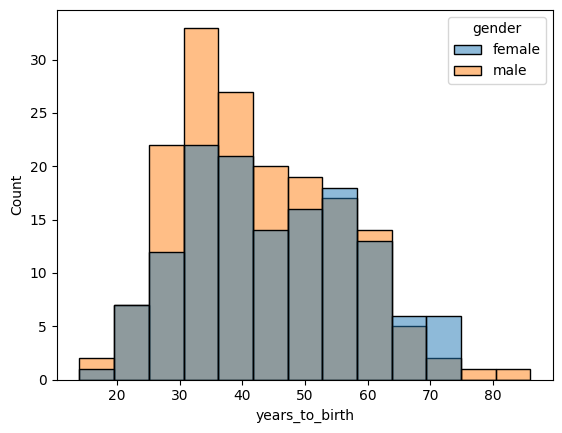

In [10]:
sns.histplot(data=data, x='years_to_birth', hue='gender');

In [11]:
data['gender'].value_counts()

gender
male      170
female    136
Name: count, dtype: int64

In [12]:
data['radiation_therapy'].value_counts()

radiation_therapy
yes    195
no     111
Name: count, dtype: int64

In [13]:
data['Grade'].value_counts()

Grade
G3    160
G2    146
Name: count, dtype: int64

In [14]:
data['outcome'].value_counts()

outcome
1    184
0    122
Name: count, dtype: int64

In [15]:
data['Percent.aneuploidy'].min(), data['Percent.aneuploidy'].max()

(5.52e-06, 0.821252896)

In [16]:
data.head()

,Case,years_to_birth,gender,histological_type,race,ethnicity,radiation_therapy,Grade,Mutation.Count,Percent.aneuploidy,...,p27_p,p27_pT157_p,p27_pT198_p,p38_pT180_Y182_p,p53_p,p62-LCK-ligand_p,p70S6K_p,p70S6K_pT389_p,p90RSK_p,p90RSK_pT359_S363_p
0,TCGA-CS-4938,31,female,astrocytoma,white,not hispanic or latino,no,G2,15,0.069412,...,-0.425127,-0.033398,0.289192,1.060163,-0.407456,-0.470354,-0.107559,-0.060441,-0.053104,-0.011132
1,TCGA-CS-6665,51,female,astrocytoma,white,not hispanic or latino,yes,G3,75,0.524814,...,0.076536,0.011809,-0.047973,-0.054275,-0.244020,0.106282,-0.034369,0.585072,0.431720,-0.201412
2,TCGA-CS-6666,22,male,astrocytoma,white,not hispanic or latino,yes,G3,18,0.403165,...,0.110268,0.066886,-0.066150,0.250434,0.432187,-0.210412,0.290949,-0.893383,-0.693677,-0.055250
3,TCGA-DB-5270,38,female,oligoastrocytoma,white,not hispanic or latino,no,G3,16,0.061382,...,-0.235321,0.015372,-0.127422,-1.190789,0.105396,0.218569,-0.099136,1.990618,0.166788,-0.235380
4,TCGA-DB-5273,33,male,astrocytoma,white,not hispanic or latino,yes,G3,16,0.017349,...,-0.343212,-0.250564,-0.234582,0.648598,-0.071851,-0.041811,-0.099300,-0.920359,-0.243159,-0.128841


In [17]:
data['histological_type'].value_counts()

histological_type
oligodendroglioma    122
oligoastrocytoma      94
astrocytoma           90
Name: count, dtype: int64

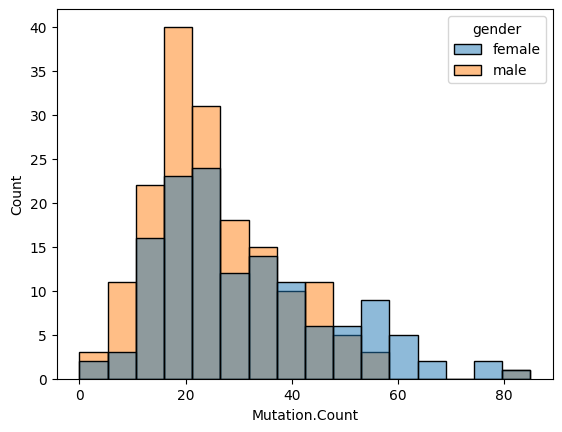

In [18]:
sns.histplot(data=data, x='Mutation.Count', hue='gender');

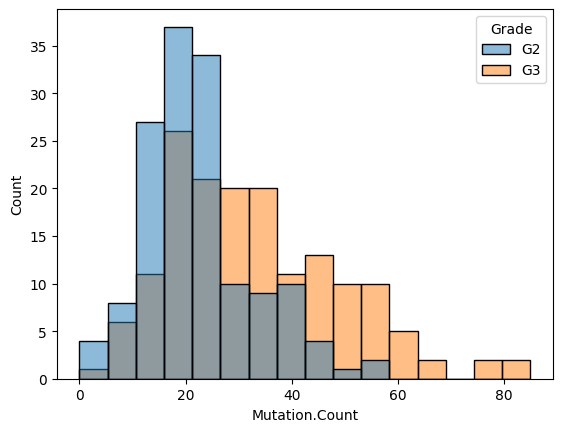

In [19]:
sns.histplot(data=data, x='Mutation.Count', hue='Grade');

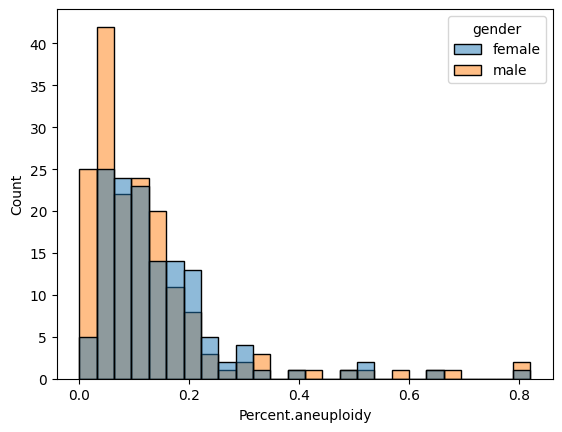

In [20]:
sns.histplot(data=data, x='Percent.aneuploidy', hue='gender');

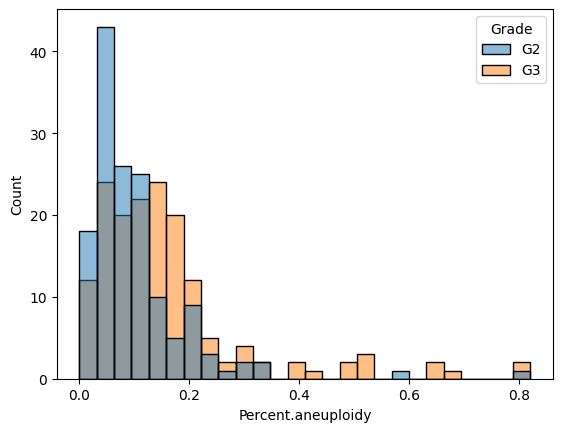

In [21]:
sns.histplot(data=data, x='Percent.aneuploidy', hue='Grade');

In [22]:
fig = px.histogram(data, x="years_to_birth",  color="gender", marginal="box",
                   hover_data=data.columns)
fig.show()

In [23]:
fig = px.histogram(data, x="Percent.aneuploidy",  color="gender", marginal="box",
                   hover_data=data.columns)
fig.show()

In [27]:
fig = px.histogram(data, x="Mutation.Count",  color="gender", marginal="box",
                   hover_data=data.columns)
fig.show()

In [70]:
gender_age_outcome = data[['years_to_birth', 'gender', 'outcome']]

In [72]:
gender_age_outcome.head()

,years_to_birth,gender,outcome
0,31,female,1
1,51,female,1
2,22,male,1
3,38,female,1
4,33,male,1


In [8]:
proteins_outcome = data.drop(['Case', 'years_to_birth', 'gender', 'histological_type', 'race',
       'ethnicity', 'radiation_therapy', 'Grade', 'Mutation.Count',
       'Percent.aneuploidy', 'IDH.status'], axis=1)

In [9]:
proteins_only = proteins_outcome.drop('outcome', axis=1)

In [10]:
proteins_only

,14-3-3_beta_p,14-3-3_epsilon_p,14-3-3_zeta_p,4E-BP1_p,4E-BP1_pS65_p,4E-BP1_pT37_T46_p,4E-BP1_pT70_p,53BP1_p,A-Raf_pS299_p,ACC1_p,...,p27_p,p27_pT157_p,p27_pT198_p,p38_pT180_Y182_p,p53_p,p62-LCK-ligand_p,p70S6K_p,p70S6K_pT389_p,p90RSK_p,p90RSK_pT359_S363_p
0,0.026223,0.250940,-0.080954,-0.420471,-0.090392,0.000000,-0.808518,-1.003871,-0.053652,-0.145543,...,-0.425127,-0.033398,0.289192,1.060163,-0.407456,-0.470354,-0.107559,-0.060441,-0.053104,-0.011132
1,-0.002637,-0.340954,0.180070,0.022611,-0.081000,0.100052,0.161428,-0.557812,-0.221878,-0.849298,...,0.076536,0.011809,-0.047973,-0.054275,-0.244020,0.106282,-0.034369,0.585072,0.431720,-0.201412
2,-0.071522,-0.288344,0.608584,0.233311,-0.116463,0.182052,0.243324,0.256262,-0.330152,-0.130743,...,0.110268,0.066886,-0.066150,0.250434,0.432187,-0.210412,0.290949,-0.893383,-0.693677,-0.055250
3,0.119700,0.269015,0.682819,-0.346712,0.676627,-1.110090,-0.123306,-0.546849,0.199141,0.419897,...,-0.235321,0.015372,-0.127422,-1.190789,0.105396,0.218569,-0.099136,1.990618,0.166788,-0.235380
4,0.131162,0.086974,0.016835,-0.009144,-0.127323,0.138158,-0.098309,0.289628,-0.150824,-0.010213,...,-0.343212,-0.250564,-0.234582,0.648598,-0.071851,-0.041811,-0.099300,-0.920359,-0.243159,-0.128841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,0.034004,-0.073706,-0.233343,0.182469,-0.116130,-0.224590,-0.025644,0.010427,0.088982,0.327068,...,-0.166682,-0.072997,0.089271,-0.124620,0.211999,0.037939,-0.022458,-0.335908,-0.126132,0.100600
302,0.041951,0.265987,0.366885,-0.088258,0.191067,-0.273193,0.142699,-0.009984,0.032283,-0.039167,...,-0.109752,0.017225,0.012680,-0.006096,0.011010,0.283044,0.126973,0.428842,0.538682,-0.028888
303,-0.041528,0.049627,0.025368,0.001091,-0.157600,-0.298388,-0.146447,0.052560,0.012256,-0.027617,...,0.049349,-0.116631,-0.039064,0.219021,0.149160,0.145902,-0.110977,-0.049480,0.140910,-0.035152
304,-0.029236,-0.030125,-0.085980,0.487722,0.207991,0.089299,0.252555,0.688223,-0.024085,0.410816,...,0.231609,0.034421,0.310362,0.435813,-0.138360,-0.148706,0.177230,-0.749877,-0.229200,-0.122342


In [11]:
proteins_only.describe().T.head(50)

,count,mean,std,min,25%,50%,75%,max
14-3-3_beta_p,306.0,0.019826,0.209680,-0.398777,-0.095497,-0.007656,0.083242,1.045979
14-3-3_epsilon_p,306.0,0.072282,0.239839,-0.680385,-0.069781,0.044880,0.217087,0.898890
14-3-3_zeta_p,306.0,0.069640,0.413425,-0.901789,-0.197243,0.006965,0.272758,1.913847
4E-BP1_p,306.0,0.028028,0.262063,-0.722812,-0.150643,0.000725,0.170646,0.996580
4E-BP1_pS65_p,306.0,0.057618,0.260887,-0.490859,-0.118454,0.016828,0.184088,1.126463
4E-BP1_pT37_T46_p,306.0,0.052389,0.637903,-1.691028,-0.347277,0.087880,0.498722,1.745698
4E-BP1_pT70_p,306.0,0.001907,0.216557,-0.808518,-0.132551,-0.036930,0.119789,1.105067
53BP1_p,306.0,0.029381,0.465490,-1.398566,-0.287253,-0.011749,0.306209,1.652101
A-Raf_pS299_p,306.0,0.023865,0.172024,-0.383246,-0.076206,0.014822,0.108097,0.674754
ACC1_p,306.0,-0.000790,0.490193,-2.051138,-0.253635,0.001772,0.288241,1.725198


In [12]:
proteins_only.describe().T['mean']

14-3-3_beta_p          0.019826
14-3-3_epsilon_p       0.072282
14-3-3_zeta_p          0.069640
4E-BP1_p               0.028028
4E-BP1_pS65_p          0.057618
                         ...   
p62-LCK-ligand_p       0.014535
p70S6K_p              -0.027670
p70S6K_pT389_p         0.097176
p90RSK_p              -0.004954
p90RSK_pT359_S363_p    0.000182
Name: mean, Length: 174, dtype: float64

<Axes: xlabel='mean', ylabel='Count'>

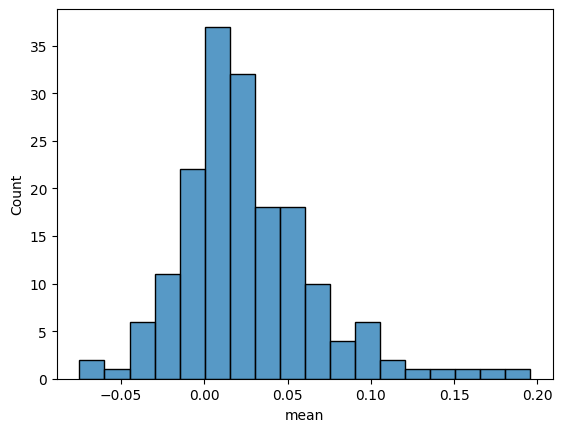

In [13]:
sns.histplot(proteins_only.describe().T['mean'])

<Axes: xlabel='14-3-3_beta_p'>

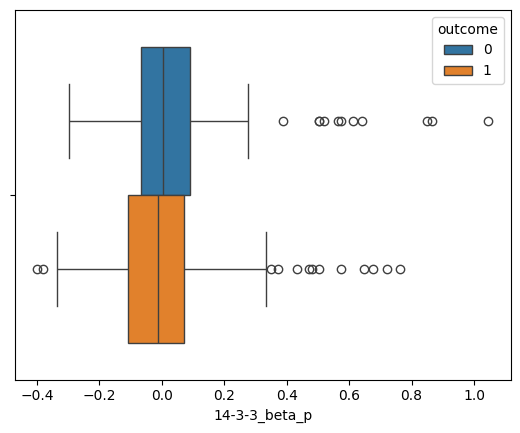

In [14]:
sns.boxplot(data=proteins_outcome, x=proteins_outcome['14-3-3_beta_p'], hue='outcome')

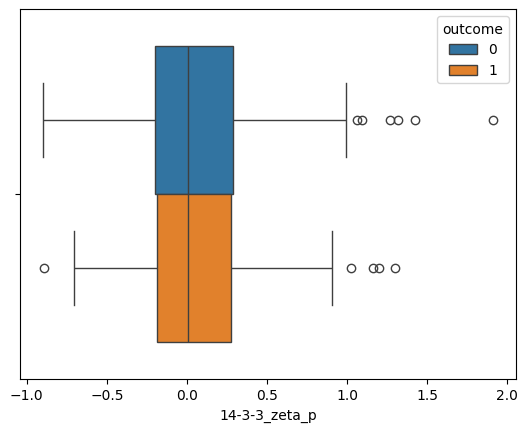

In [15]:
sns.boxplot(data=proteins_outcome, x=proteins_outcome['14-3-3_zeta_p'], hue='outcome');


<Axes: xlabel='14-3-3_epsilon_p'>

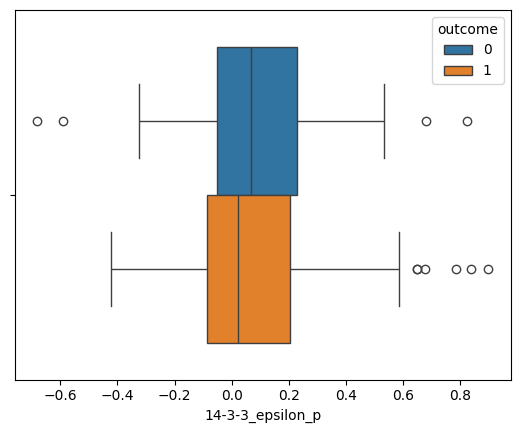

In [17]:
sns.boxplot(data=proteins_outcome, x=proteins_outcome['14-3-3_epsilon_p'], hue='outcome')

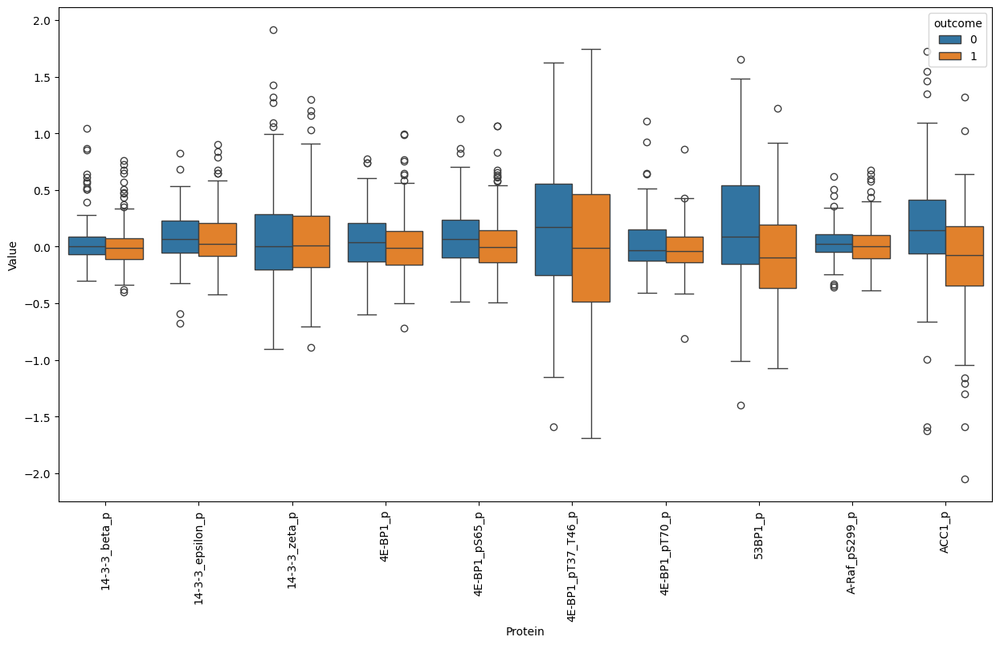

In [27]:
# Melt the dataframe to convert protein columns into a single column
melted_df = proteins_outcome.melt(id_vars='outcome', var_name='Protein', value_name='Value')

# Plot the boxplot
plt.figure(figsize=(15, 8))  # Adjust the figure size if needed
sns.boxplot(x='Protein', y='Value', hue='outcome', data=melted_df.iloc[0:3060])
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [29]:
melted_df.iloc[3061:6120]

,outcome,Protein,Value
3061,1,ACC_pS79_p,-0.504137
3062,1,ACC_pS79_p,0.103593
3063,1,ACC_pS79_p,-0.303717
3064,1,ACC_pS79_p,0.340964
3065,1,ACC_pS79_p,0.310812
...,...,...,...
6115,1,Akt_pT308_p,-0.455455
6116,0,Akt_pT308_p,-0.118628
6117,0,Akt_pT308_p,0.046269
6118,1,Akt_pT308_p,-0.217829


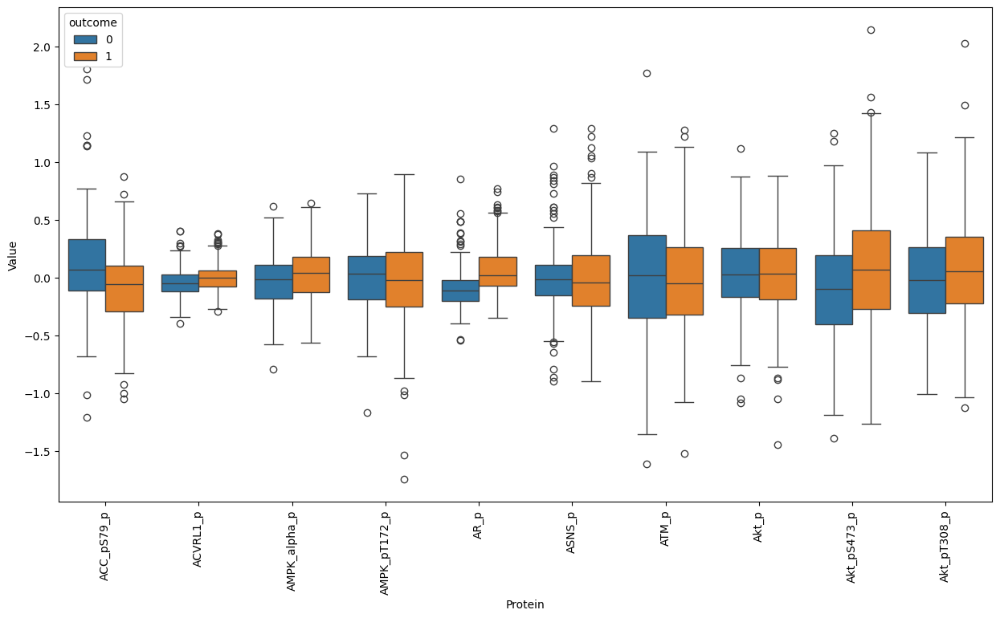

In [30]:
# Plot the boxplot
plt.figure(figsize=(15, 8))  # Adjust the figure size if needed
sns.boxplot(x='Protein', y='Value', hue='outcome', data=melted_df.iloc[3061:6120])
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [38]:
melted_df.iloc[6120:9180]

,outcome,Protein,Value
6120,1,Annexin_VII_p,0.503990
6121,1,Annexin_VII_p,-0.095514
6122,1,Annexin_VII_p,-0.348202
6123,1,Annexin_VII_p,-0.038140
6124,1,Annexin_VII_p,0.232127
...,...,...,...
9175,1,Beclin_p,0.083913
9176,0,Beclin_p,0.060326
9177,0,Beclin_p,-0.031724
9178,1,Beclin_p,-0.076217


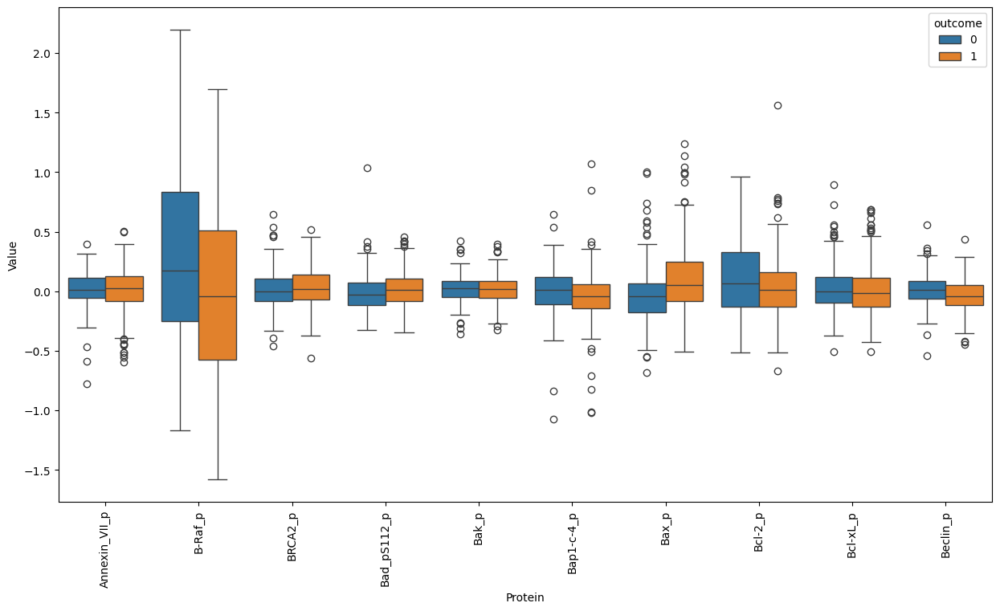

In [45]:
# Plot the boxplot
plt.figure(figsize=(15, 8))  # Adjust the figure size if needed
sns.boxplot(x='Protein', y='Value', hue='outcome', data=melted_df.iloc[6120:9180])
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [43]:
melted_df.iloc[9180:12241]

,outcome,Protein,Value
9180,1,Bid_p,-0.023008
9181,1,Bid_p,-0.152726
9182,1,Bid_p,0.085926
9183,1,Bid_p,-0.077922
9184,1,Bid_p,0.151327
...,...,...,...
12236,0,Caveolin-1_p,-0.517896
12237,0,Caveolin-1_p,-0.253510
12238,1,Caveolin-1_p,1.973245
12239,0,Caveolin-1_p,0.805184


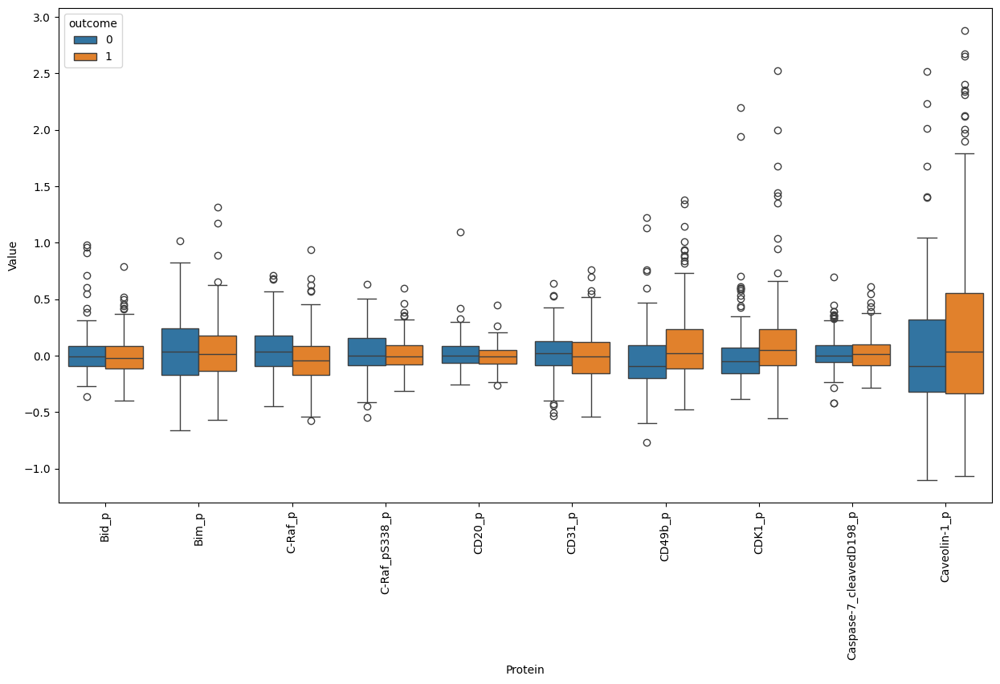

In [46]:
# Plot the boxplot
plt.figure(figsize=(15, 8))  # Adjust the figure size if needed
sns.boxplot(x='Protein', y='Value', hue='outcome', data=melted_df.iloc[9180:12240])
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [68]:
melted_df.iloc[12240:15300]['Value'].max()

3.253636467

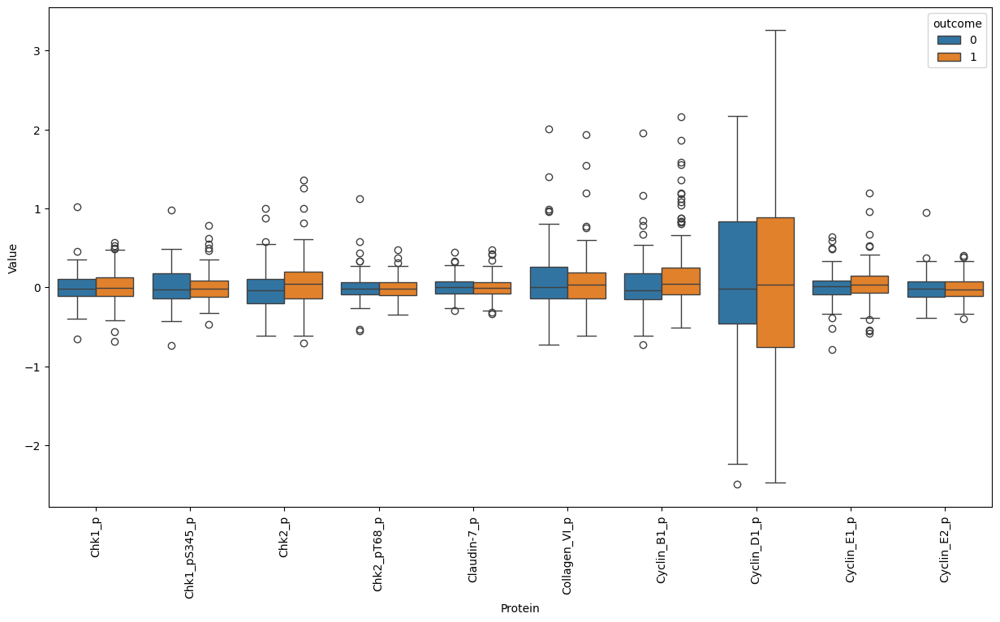

In [50]:
# Plot the boxplot
plt.figure(figsize=(15, 8))  # Adjust the figure size if needed
sns.boxplot(x='Protein', y='Value', hue='outcome', data=melted_df.iloc[12240:15300])
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [51]:
proteins_outcome

,outcome,14-3-3_beta_p,14-3-3_epsilon_p,14-3-3_zeta_p,4E-BP1_p,4E-BP1_pS65_p,4E-BP1_pT37_T46_p,4E-BP1_pT70_p,53BP1_p,A-Raf_pS299_p,...,p27_p,p27_pT157_p,p27_pT198_p,p38_pT180_Y182_p,p53_p,p62-LCK-ligand_p,p70S6K_p,p70S6K_pT389_p,p90RSK_p,p90RSK_pT359_S363_p
0,1,0.026223,0.250940,-0.080954,-0.420471,-0.090392,0.000000,-0.808518,-1.003871,-0.053652,...,-0.425127,-0.033398,0.289192,1.060163,-0.407456,-0.470354,-0.107559,-0.060441,-0.053104,-0.011132
1,1,-0.002637,-0.340954,0.180070,0.022611,-0.081000,0.100052,0.161428,-0.557812,-0.221878,...,0.076536,0.011809,-0.047973,-0.054275,-0.244020,0.106282,-0.034369,0.585072,0.431720,-0.201412
2,1,-0.071522,-0.288344,0.608584,0.233311,-0.116463,0.182052,0.243324,0.256262,-0.330152,...,0.110268,0.066886,-0.066150,0.250434,0.432187,-0.210412,0.290949,-0.893383,-0.693677,-0.055250
3,1,0.119700,0.269015,0.682819,-0.346712,0.676627,-1.110090,-0.123306,-0.546849,0.199141,...,-0.235321,0.015372,-0.127422,-1.190789,0.105396,0.218569,-0.099136,1.990618,0.166788,-0.235380
4,1,0.131162,0.086974,0.016835,-0.009144,-0.127323,0.138158,-0.098309,0.289628,-0.150824,...,-0.343212,-0.250564,-0.234582,0.648598,-0.071851,-0.041811,-0.099300,-0.920359,-0.243159,-0.128841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,1,0.034004,-0.073706,-0.233343,0.182469,-0.116130,-0.224590,-0.025644,0.010427,0.088982,...,-0.166682,-0.072997,0.089271,-0.124620,0.211999,0.037939,-0.022458,-0.335908,-0.126132,0.100600
302,0,0.041951,0.265987,0.366885,-0.088258,0.191067,-0.273193,0.142699,-0.009984,0.032283,...,-0.109752,0.017225,0.012680,-0.006096,0.011010,0.283044,0.126973,0.428842,0.538682,-0.028888
303,0,-0.041528,0.049627,0.025368,0.001091,-0.157600,-0.298388,-0.146447,0.052560,0.012256,...,0.049349,-0.116631,-0.039064,0.219021,0.149160,0.145902,-0.110977,-0.049480,0.140910,-0.035152
304,1,-0.029236,-0.030125,-0.085980,0.487722,0.207991,0.089299,0.252555,0.688223,-0.024085,...,0.231609,0.034421,0.310362,0.435813,-0.138360,-0.148706,0.177230,-0.749877,-0.229200,-0.122342


In [88]:
# # Assuming df is your dataframe with 'outcome' and 174 protein columns

# # Initialize an empty dictionary to store p-values for each protein
# p_values = {}

# # Loop through each protein column and perform t-test
# for column in proteins_outcome.drop('outcome', axis=1):  # Exclude the 'outcome' column
#     group_0 = proteins_outcome[proteins_outcome['outcome'] == 0][column]
#     group_1 = proteins_outcome[proteins_outcome['outcome'] == 1][column]
#     t_stat, p_val = ttest_ind(group_0, group_1)
#     p_values[column] = p_val

# # Sort the p-values dictionary by values
# sorted_p_values = {k: v for k, v in sorted(p_values.items(), key=lambda item: item[1])}

# # Print the sorted p-values
# for protein, p_val in sorted_p_values.items():
#     print(f"Protein: {protein}, p-value: {p_val}")

In [58]:
import pandas as pd
from scipy.stats import ttest_ind

# Initialize an empty list to store protein names and corresponding p-values
protein_p_values = []

# Loop through each protein column and perform t-test
for column in proteins_outcome.drop('outcome', axis=1):  # Exclude the 'outcome' column
    group_0 = proteins_outcome[proteins_outcome['outcome'] == 0][column]
    group_1 = proteins_outcome[proteins_outcome['outcome'] == 1][column]
    t_stat, p_val = ttest_ind(group_0, group_1)
    protein_p_values.append({'Protein': column, 'p-value': p_val})

# Create a DataFrame from the list of dictionaries
p_values_df = pd.DataFrame(protein_p_values)

# Sort the DataFrame by p-values
p_values_df = p_values_df.sort_values(by='p-value')

# Reset index
p_values_df.reset_index(drop=True, inplace=True)

# Print the DataFrame
p_values_df

,Protein,p-value
0,Syk_p,3.385636e-11
1,YAP_pS127_p,1.678460e-09
2,AR_p,3.858150e-09
3,ACC1_p,7.671502e-07
4,YAP_p,1.139554e-06
...,...,...
169,PEA15_pS116_p,9.517016e-01
170,ASNS_p,9.659298e-01
171,Fibronectin_p,9.669654e-01
172,Cyclin_E2_p,9.938696e-01


In [61]:
p_values_df[p_values_df['p-value']<= 0.05]

,Protein,p-value
0,Syk_p,3.385636e-11
1,YAP_pS127_p,1.678460e-09
2,AR_p,3.858150e-09
3,ACC1_p,7.671502e-07
4,YAP_p,1.139554e-06
5,HER3_pY1289_p,1.153899e-06
6,c-Kit_p,2.440837e-06
7,ACC_pS79_p,4.694171e-06
8,STAT3_pY705_p,8.408725e-06
9,DJ-1_p,1.042737e-05


In [65]:
P60_list = p_values_df[p_values_df['p-value']<= 0.05]['Protein'].tolist()

In [66]:
P60_list

['Syk_p',
 'YAP_pS127_p',
 'AR_p',
 'ACC1_p',
 'YAP_p',
 'HER3_pY1289_p',
 'c-Kit_p',
 'ACC_pS79_p',
 'STAT3_pY705_p',
 'DJ-1_p',
 '53BP1_p',
 'p27_p',
 'PDK1_p',
 'S6_pS235_S236_p',
 'PRDX1_p',
 'Bax_p',
 'IRS1_p',
 'FASN_p',
 'PTEN_p',
 'PDK1_pS241_p',
 'CD49b_p',
 'PREX1_p',
 'Tuberin_p',
 'B-Raf_p',
 'STAT5-alpha_p',
 'Beclin_p',
 'C-Raf_p',
 'PRAS40_pT246_p',
 'Dvl3_p',
 'ER-alpha_pS118_p',
 'EGFR_pY1068_p',
 'VEGFR2_p',
 'Cyclin_B1_p',
 '4E-BP1_pT37_T46_p',
 'Paxillin_p',
 'p27_pT157_p',
 'S6_pS240_S244_p',
 'p90RSK_p',
 'Chk2_p',
 'Src_pY416_p',
 'YB-1_pS102_p',
 'eEF2K_p',
 'HER2_pY1248_p',
 'E-Cadherin_p',
 '4E-BP1_pS65_p',
 'Akt_pS473_p',
 'HER3_p',
 'MIG-6_p',
 'p70S6K_pT389_p',
 'ACVRL1_p',
 'mTOR_p',
 'CDK1_p',
 '4E-BP1_pT70_p',
 'GSK3-alpha-beta_pS21_S9_p',
 'EGFR_pY1173_p',
 'S6_p',
 'MEK1_p',
 'TFRC_p',
 'Caveolin-1_p',
 'Src_pY527_p']

In [63]:
# Number of comparisons (number of protein columns)
num_comparisons = len(proteins_outcome.drop('outcome', axis=1))

# Perform Bonferroni correction
p_values_df['Adjusted p-value'] = p_values_df['p-value'] * num_comparisons

# Ensure adjusted p-values do not exceed 1
p_values_df['Adjusted p-value'] = p_values_df['Adjusted p-value'].clip(upper=1)

# Print the DataFrame with adjusted p-values
p_values_df

,Protein,p-value,Adjusted p-value
0,Syk_p,3.385636e-11,1.036005e-08
1,YAP_pS127_p,1.678460e-09,5.136089e-07
2,AR_p,3.858150e-09,1.180594e-06
3,ACC1_p,7.671502e-07,2.347480e-04
4,YAP_p,1.139554e-06,3.487034e-04
...,...,...,...
169,PEA15_pS116_p,9.517016e-01,1.000000e+00
170,ASNS_p,9.659298e-01,1.000000e+00
171,Fibronectin_p,9.669654e-01,1.000000e+00
172,Cyclin_E2_p,9.938696e-01,1.000000e+00


In [64]:
p_values_df[p_values_df['Adjusted p-value']<= 0.05]

,Protein,p-value,Adjusted p-value
0,Syk_p,3.385636e-11,1.036005e-08
1,YAP_pS127_p,1.678460e-09,5.136089e-07
2,AR_p,3.858150e-09,1.180594e-06
3,ACC1_p,7.671502e-07,2.347480e-04
4,YAP_p,1.139554e-06,3.487034e-04
5,HER3_pY1289_p,1.153899e-06,3.530932e-04
6,c-Kit_p,2.440837e-06,7.468962e-04
7,ACC_pS79_p,4.694171e-06,1.436416e-03
8,STAT3_pY705_p,8.408725e-06,2.573070e-03
9,DJ-1_p,1.042737e-05,3.190774e-03


In [124]:
P17_list = p_values_df[p_values_df['Adjusted p-value']<= 0.05]['Protein'].tolist()
P17_list

['Syk_p',
 'YAP_pS127_p',
 'AR_p',
 'ACC1_p',
 'YAP_p',
 'HER3_pY1289_p',
 'c-Kit_p',
 'ACC_pS79_p',
 'STAT3_pY705_p',
 'DJ-1_p',
 '53BP1_p',
 'p27_p',
 'PDK1_p',
 'S6_pS235_S236_p',
 'PRDX1_p',
 'Bax_p',
 'IRS1_p']

In [73]:
# Checking Statistical significance of Gender Age Output

In [74]:
gender_age_outcome.head()

,years_to_birth,gender,outcome
0,31,female,1
1,51,female,1
2,22,male,1
3,38,female,1
4,33,male,1


In [85]:
from sklearn.preprocessing import LabelEncoder

# Create a label encoder object
label_encoder = LabelEncoder()

# Encode the 'gender' column
gender_age_outcome['gender_encoded'] = label_encoder.fit_transform(gender_age_outcome['gender'])

/tmp/ipykernel_102563/3199999017.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [86]:
gender_age_outcome

,years_to_birth,gender,outcome,gender_encoded
0,31,female,1,0
1,51,female,1,0
2,22,male,1,1
3,38,female,1,0
4,33,male,1,1
...,...,...,...,...
301,30,male,1,1
302,46,male,0,1
303,36,male,0,1
304,44,male,1,1


In [87]:
import pandas as pd
from scipy.stats import ttest_ind

# Perform independent t-tests for 'age' and 'gender' columns based on the 'outcome' column
t_stat_age, p_val_age = ttest_ind(gender_age_outcome[gender_age_outcome['outcome'] == 0]['years_to_birth'], 
                                  gender_age_outcome[gender_age_outcome['outcome'] == 1]['years_to_birth'])
t_stat_gender, p_val_gender = ttest_ind(gender_age_outcome[gender_age_outcome['outcome'] == 0]['gender_encoded'], 
                                        gender_age_outcome[gender_age_outcome['outcome'] == 1]['gender_encoded'])

# Print the p-values for 'age' and 'gender' columns
print(f"p-value for age: {p_val_age}")
print(f"p-value for gender: {p_val_gender}")

p-value for age: 0.01106098915501576
p-value for gender: 0.7748621104407485


In [ ]:
# Checking Statistical significance of the other features

In [93]:
data.head()

,Case,years_to_birth,gender,histological_type,race,ethnicity,radiation_therapy,Grade,Mutation.Count,Percent.aneuploidy,...,p27_p,p27_pT157_p,p27_pT198_p,p38_pT180_Y182_p,p53_p,p62-LCK-ligand_p,p70S6K_p,p70S6K_pT389_p,p90RSK_p,p90RSK_pT359_S363_p
0,TCGA-CS-4938,31,female,astrocytoma,white,not hispanic or latino,no,G2,15,0.069412,...,-0.425127,-0.033398,0.289192,1.060163,-0.407456,-0.470354,-0.107559,-0.060441,-0.053104,-0.011132
1,TCGA-CS-6665,51,female,astrocytoma,white,not hispanic or latino,yes,G3,75,0.524814,...,0.076536,0.011809,-0.047973,-0.054275,-0.244020,0.106282,-0.034369,0.585072,0.431720,-0.201412
2,TCGA-CS-6666,22,male,astrocytoma,white,not hispanic or latino,yes,G3,18,0.403165,...,0.110268,0.066886,-0.066150,0.250434,0.432187,-0.210412,0.290949,-0.893383,-0.693677,-0.055250
3,TCGA-DB-5270,38,female,oligoastrocytoma,white,not hispanic or latino,no,G3,16,0.061382,...,-0.235321,0.015372,-0.127422,-1.190789,0.105396,0.218569,-0.099136,1.990618,0.166788,-0.235380
4,TCGA-DB-5273,33,male,astrocytoma,white,not hispanic or latino,yes,G3,16,0.017349,...,-0.343212,-0.250564,-0.234582,0.648598,-0.071851,-0.041811,-0.099300,-0.920359,-0.243159,-0.128841


In [99]:
data.columns[0:13]

Index(['Case', 'years_to_birth', 'gender', 'histological_type', 'race',
       'ethnicity', 'radiation_therapy', 'Grade', 'Mutation.Count',
       'Percent.aneuploidy', 'IDH.status', 'outcome', '14-3-3_beta_p'],
      dtype='object')

In [101]:
other_features = data[['radiation_therapy', 'Grade', 'Mutation.Count',
       'Percent.aneuploidy', 'IDH.status', 'outcome']]
other_features.head()

,radiation_therapy,Grade,Mutation.Count,Percent.aneuploidy,IDH.status,outcome
0,no,G2,15,0.069412,Mutant,1
1,yes,G3,75,0.524814,Mutant,1
2,yes,G3,18,0.403165,Mutant,1
3,no,G3,16,0.061382,Mutant,1
4,yes,G3,16,0.017349,Mutant,1


In [104]:
other_features['IDH.status'].value_counts()

IDH.status
Mutant    269
WT         37
Name: count, dtype: int64

In [105]:
other_features['radiation_therapy'].value_counts()

radiation_therapy
yes    195
no     111
Name: count, dtype: int64

In [108]:
other_features['Grade'].value_counts()

Grade
G3    160
G2    146
Name: count, dtype: int64

In [111]:
from sklearn.preprocessing import LabelEncoder

# Create a label encoder object
label_encoder = LabelEncoder()

# Encode the 'gender' column
other_features['radiation_encoded'] = label_encoder.fit_transform(other_features['radiation_therapy'])
other_features['IDH_encoded'] = label_encoder.fit_transform(other_features['IDH.status'])
other_features['Grade_encoded'] = label_encoder.fit_transform(other_features['Grade'])

In [112]:
other_features

,radiation_therapy,Grade,Mutation.Count,Percent.aneuploidy,IDH.status,outcome,radiation_encoded,IDH_encoded,Grade_encoded
0,no,G2,15,0.069412,Mutant,1,0,0,0
1,yes,G3,75,0.524814,Mutant,1,1,0,1
2,yes,G3,18,0.403165,Mutant,1,1,0,1
3,no,G3,16,0.061382,Mutant,1,0,0,1
4,yes,G3,16,0.017349,Mutant,1,1,0,1
...,...,...,...,...,...,...,...,...,...
301,no,G2,21,0.142862,Mutant,1,0,0,0
302,no,G2,3,0.085319,Mutant,0,0,0,0
303,no,G3,11,0.083868,Mutant,0,0,0,1
304,yes,G3,27,0.131174,Mutant,1,1,0,1


In [114]:
import pandas as pd
from scipy.stats import ttest_ind

# Perform independent t-tests for 'age' and 'gender' columns based on the 'outcome' column
t_stat_mutation, p_val_mutation = ttest_ind(other_features[other_features['outcome'] == 0]['Mutation.Count'], 
                                  other_features[other_features['outcome'] == 1]['Mutation.Count'])


t_stat_aneuploidy, p_val_aneuploidy = ttest_ind(other_features[other_features['outcome'] == 0]['Percent.aneuploidy'], 
                                        other_features[other_features['outcome'] == 1]['Percent.aneuploidy'])


t_stat_radiation, p_val_radiation = ttest_ind(other_features[other_features['outcome'] == 0]['radiation_encoded'], 
                                        other_features[other_features['outcome'] == 1]['radiation_encoded'])


t_stat_idh, p_val_idh = ttest_ind(other_features[other_features['outcome'] == 0]['IDH_encoded'], 
                                        other_features[other_features['outcome'] == 1]['IDH_encoded'])


t_stat_Grade, p_val_Grade = ttest_ind(other_features[other_features['outcome'] == 0]['Grade_encoded'], 
                                        other_features[other_features['outcome'] == 1]['Grade_encoded'])


# Print the p-values for 'age' and 'gender' columns
print(f"p-value for mutation: {p_val_mutation}")
print(f"p-value for aneuploidy: {p_val_aneuploidy}")
print(f"p-value for radiation: {p_val_radiation}")
print(f"p-value for IDH: {p_val_idh}")
print(f"p-value for Grade: {p_val_Grade}")


p-value for mutation: 0.07911258523046479
p-value for aneuploidy: 0.6988443976515548
p-value for radiation: 0.00011594274936964503
p-value for IDH: 0.0016511350024816102
p-value for Grade: 0.0012027170911447888


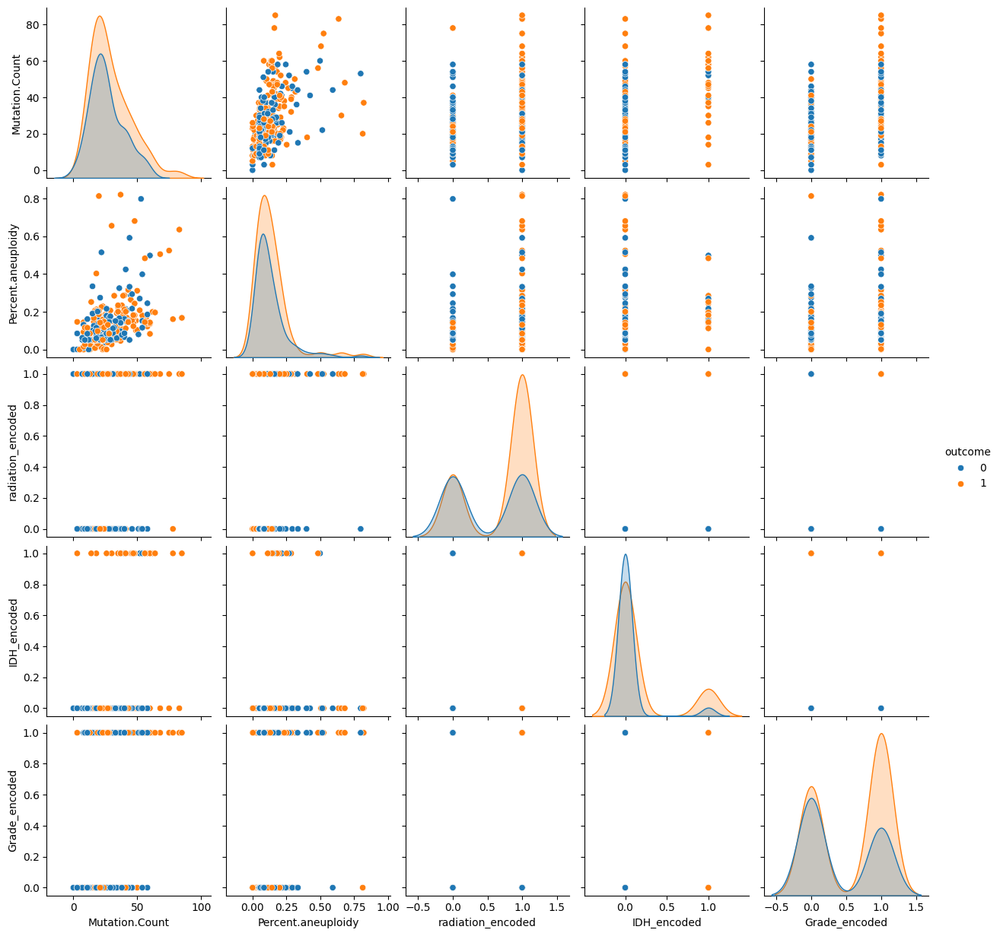

In [117]:
sns.pairplot(other_features, hue='outcome')

In [ ]:
#### Make VISUALIZATIONS for the relevant columns ####

In [ ]:
#### AGE ####

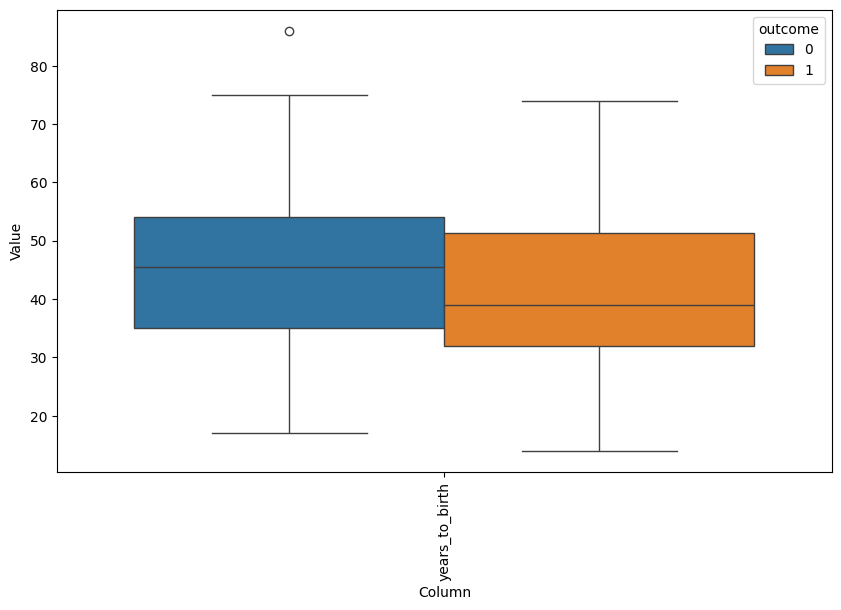

In [133]:
# Melt the dataframe to convert specific columns into a single column
melted_df_age = data.melt(id_vars='outcome', value_vars=['years_to_birth'], var_name='Column', value_name='Value')

# Plot the boxplot
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
sns.boxplot(x='Column', y='Value', hue='outcome', data=melted_df_age)
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [135]:
### IDH Status ###

In [134]:
P17_list

['Syk_p',
 'YAP_pS127_p',
 'AR_p',
 'ACC1_p',
 'YAP_p',
 'HER3_pY1289_p',
 'c-Kit_p',
 'ACC_pS79_p',
 'STAT3_pY705_p',
 'DJ-1_p',
 '53BP1_p',
 'p27_p',
 'PDK1_p',
 'S6_pS235_S236_p',
 'PRDX1_p',
 'Bax_p',
 'IRS1_p']

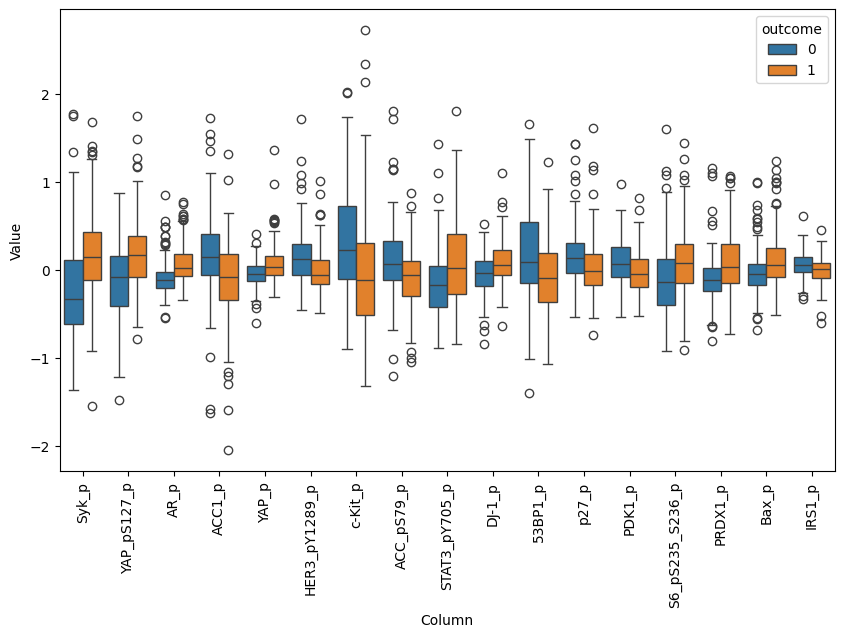

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your dataframe with 'outcome', 'age', 'gender', and other protein columns
# And you have a list of specific columns to plot
#specific_columns = ['years_to_birth'] + P17_list   # Example list of specific columns

# Melt the dataframe to convert specific columns into a single column
melted_df_sign = data.melt(id_vars='outcome', value_vars=P17_list, var_name='Column', value_name='Value')

# Plot the boxplot
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
sns.boxplot(x='Column', y='Value', hue='outcome', data=melted_df_sign)
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [78]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots


# # Create initial histogram
# fig = make_subplots(rows=1, cols=1)

# # Add traces for each gender
# traces = []
# for gender in data['gender'].unique():
#     trace = go.Histogram(
#         x=data[data['gender'] == gender]['years_to_birth'],
#         name=gender,
#         opacity=0.6
#     )
#     traces.append(trace)

# # Add traces to figure
# for trace in traces:
#     fig.add_trace(trace)

# # Create buttons for selecting gender
# buttons = []
# genders = data['gender'].unique()

# for gender in genders:
#     visible = [False] * len(genders)
#     visible[list(genders).index(gender)] = True
#     button = dict(label=gender, method='update', args=[{'visible': visible}, {'title': f'Age distribution for {gender}'}])
#     buttons.append(button)

# # Update layout to include buttons
# fig.update_layout(
#     updatemenus=[
#         dict(
#             type='buttons',
#             direction='down',
#             buttons=buttons,
#             x=1.1,
#             y=1.1
#         ),
#     ]
# )

# # Set initial title
# fig.update_layout(title='Age distribution for Male')

# # Show plot
# fig.show()

In [79]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots


# # Create initial histogram
# fig = make_subplots(rows=1, cols=1)

# # Add traces for each gender
# traces = []
# for gender in data['gender'].unique():
#     trace = go.Histogram(
#         x=data[data['gender'] == gender]['Percent.aneuploidy'],
#         name=gender,
#         opacity=0.6
#     )
#     traces.append(trace)

# # Add traces to figure
# for trace in traces:
#     fig.add_trace(trace)

# # Create buttons for selecting gender
# buttons = []
# genders = data['gender'].unique()

# for gender in genders:
#     visible = [False] * len(genders)
#     visible[list(genders).index(gender)] = True
#     button = dict(label=gender, method='update', args=[{'visible': visible}, {'title': f'Distribution for {gender}'}])
#     buttons.append(button)

# # Update layout to include buttons
# fig.update_layout(
#     updatemenus=[
#         dict(
#             type='buttons',
#             direction='down',
#             buttons=buttons,
#             x=1.1,
#             y=1.1
#         ),
#     ]
# )

# # Set initial title
# fig.update_layout(title='Distribution for Male')

# # Show plot
# fig.show()

In [80]:
# # Create initial histogram
# fig = make_subplots(rows=1, cols=1)

# # Add traces for each gender
# traces = []
# for gender in data['gender'].unique():
#     trace = go.Histogram(
#         x=data[data['gender'] == gender]['years_to_birth'],
#         name=gender,
#         opacity=0.6
#     )
#     traces.append(trace)

# # Add traces to figure
# for trace in traces:
#     fig.add_trace(trace)

# # Create buttons for selecting gender or cumulative
# buttons = []
# genders = data['gender'].unique()

# for gender in genders:
#     visible = [False] * len(genders)
#     visible[list(genders).index(gender)] = True
#     button = dict(label=gender, method='update', args=[{'visible': visible}, {'title': f'Distribution for {gender}'}])
#     buttons.append(button)

# # Add button for cumulative
# all_visible = [True] * len(genders)
# button_cumulative = dict(label='Cumulative', method='update', args=[{'visible': all_visible}, {'title': 'Cumulative Distribution'}])
# buttons.append(button_cumulative)

# # Update layout to include buttons
# fig.update_layout(
#     updatemenus=[
#         dict(
#             type='buttons',
#             direction='down',
#             buttons=buttons,
#             x=1.1,
#             y=1.1
#         ),
#     ]
# )

# # Set initial title
# fig.update_layout(title='Distribution for Male')

# # Set y-axis range and label
# fig.update_yaxes(range=[0, 35], title_text='Count')

# # Show plot
# fig.show()